<a href="https://colab.research.google.com/github/mgarbanzo/MeteoPythonUCR/blob/main/Series_de_Tiempo_y_Transformada_de_Fourier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pylab as plt
import pandas as pd

# Lectura de datos y procesamiento

In [2]:
UCR = pd.read_csv('./EstacionUCR_SantaCruz.txt', delimiter=' ')

In [3]:
UCR

,FechaHora,Pres(hPa),PresLogger(hPa),Temp(C),TempLogger(F),Hum(%),HumLogger(%),Precip(in),Viento(mph),DirViento
0,2019-01-17T19:12:50Z,1007.18,1008.07,34.24,107.75,39.96,25.36,0.0,10.7,West
1,2019-01-17T19:12:55Z,1007.30,1007.92,34.60,107.75,38.76,25.39,0.0,21.5,West
2,2019-01-17T19:13:00Z,1007.39,1008.01,34.55,107.81,38.12,25.42,0.0,20.0,West
3,2019-01-17T19:13:05Z,1007.35,1007.95,34.46,107.81,37.87,25.42,0.0,18.4,West
4,2019-01-17T19:13:10Z,1007.28,1008.11,34.52,107.77,37.88,25.44,0.0,18.4,NoWind
...,...,...,...,...,...,...,...,...,...,...
500986,2019-02-15T19:31:28Z,1005.09,1005.95,36.39,118.00,39.50,22.34,0.0,10.7,South
500987,2019-02-15T19:31:33Z,1005.13,1005.95,36.75,118.02,38.37,22.31,0.0,13.8,South
500988,2019-02-15T19:31:38Z,1005.11,1005.91,36.90,117.94,37.61,22.19,0.0,12.3,South
500989,2019-02-15T19:31:43Z,1005.11,1005.92,36.92,117.88,37.22,22.16,0.0,13.8,South


In [8]:
UCR['FechaHora'] = pd.to_datetime(UCR['FechaHora'])

# Graficación básica de variables

(array([2.3000e+01, 5.1000e+01, 4.3100e+02, 5.1500e+02, 6.2800e+02,
        1.0440e+03, 8.8200e+02, 2.5300e+02, 3.7600e+02, 6.9600e+02,
        8.3600e+02, 5.5600e+02, 1.2010e+03, 1.1730e+03, 9.9800e+02,
        1.3740e+03, 1.3880e+03, 1.7030e+03, 1.6980e+03, 1.6390e+03,
        1.3380e+03, 1.6730e+03, 1.7090e+03, 1.9660e+03, 1.6390e+03,
        1.7120e+03, 2.1780e+03, 2.5700e+03, 3.3920e+03, 4.1700e+03,
        5.9710e+03, 6.7110e+03, 1.1512e+04, 2.2169e+04, 2.9721e+04,
        2.9851e+04, 2.2305e+04, 1.6739e+04, 1.5575e+04, 1.2717e+04,
        1.3047e+04, 1.1404e+04, 8.9890e+03, 8.7000e+03, 7.0360e+03,
        6.8310e+03, 6.6700e+03, 6.9840e+03, 5.9090e+03, 5.4880e+03,
        5.3070e+03, 4.7760e+03, 5.0200e+03, 4.9260e+03, 4.8020e+03,
        4.8420e+03, 4.8720e+03, 4.8720e+03, 4.9400e+03, 4.8930e+03,
        5.3680e+03, 5.4190e+03, 5.5280e+03, 6.0050e+03, 6.3060e+03,
        6.3840e+03, 7.0820e+03, 8.1300e+03, 8.0060e+03, 8.6590e+03,
        9.4270e+03, 8.6920e+03, 8.2630e+03, 7.63

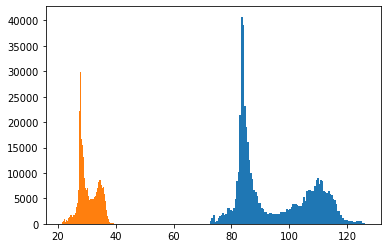

In [4]:
plt.figure()
plt.hist(UCR['TempLogger(F)'],bins=100)
plt.hist(UCR['Temp(C)'],bins=100)

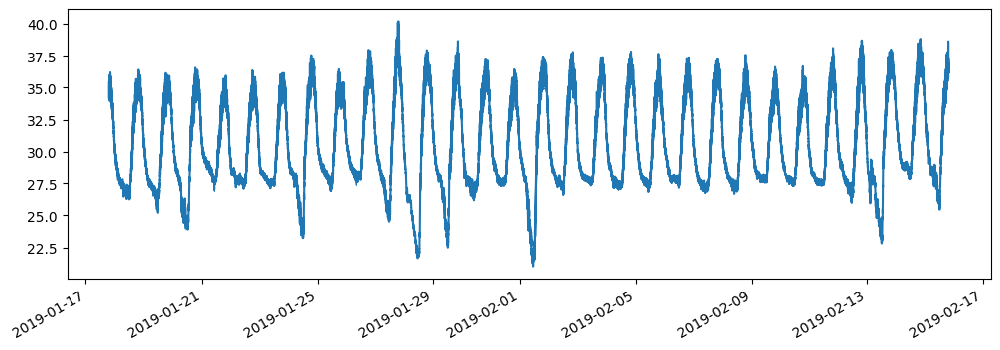

In [13]:
fig = plt.figure(figsize=(12,4),dpi=100)
plt.plot(UCR['FechaHora'],UCR['Temp(C)'])
fig.autofmt_xdate()

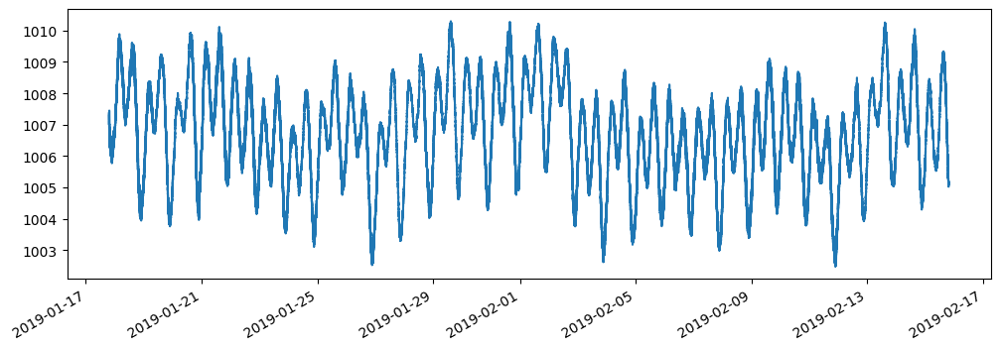

In [15]:
fig = plt.figure(figsize=(12,4),dpi=100)
plt.plot(UCR['FechaHora'],UCR['Pres(hPa)'])
fig.autofmt_xdate()

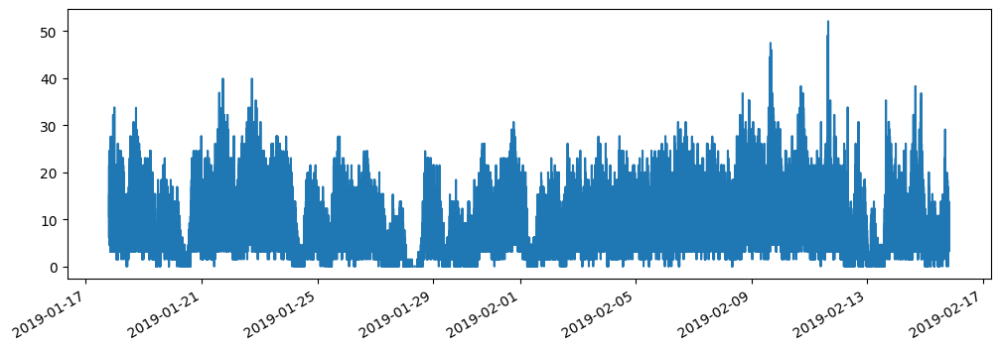

In [16]:
fig = plt.figure(figsize=(12,4),dpi=100)
plt.plot(UCR['FechaHora'],UCR['Viento(mph)'])
fig.autofmt_xdate()

# Graficación dinámica de variables

In [37]:
import numpy as np
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
output_notebook()

In [50]:
p = figure(width=1600, height=600, x_axis_type='datetime')
p.line(datetime,T)
show(p)

# Cálculo de transformada de Fourier

In [47]:
T = UCR['Temp(C)'].to_numpy()
datetime = UCR['FechaHora'].to_numpy()

print(T[:-1]), datetime[:-1]

[34.24 34.6  34.55 ... 36.75 36.9  36.92]


(None, array([Timestamp('2019-01-17 19:12:50+0000', tz='UTC'),
        Timestamp('2019-01-17 19:12:55+0000', tz='UTC'),
        Timestamp('2019-01-17 19:13:00+0000', tz='UTC'), ...,
        Timestamp('2019-02-15 19:31:33+0000', tz='UTC'),
        Timestamp('2019-02-15 19:31:38+0000', tz='UTC'),
        Timestamp('2019-02-15 19:31:43+0000', tz='UTC')], dtype=object))

In [57]:
T = T[:-1] - np.mean(T[:-1])

In [58]:
FT = np.fft.fft(T[:-1])

In [59]:
FT

array([-6.50349744e+00+8.65085781e-13j,  1.37071010e+04+5.60048589e+04j,
       -4.93543641e+03+9.46131036e+03j, ...,
        5.16559367e+04-6.78973233e+04j, -4.93543641e+03-9.46131036e+03j,
        1.37071010e+04-5.60048589e+04j])

In [67]:
datetime[101] - datetime[100]

Timedelta('0 days 00:00:05')

In [68]:
XFT = np.fft.fftfreq(len(FT),d=5)

# Graficación del espectro

(0.0, 4e-05)

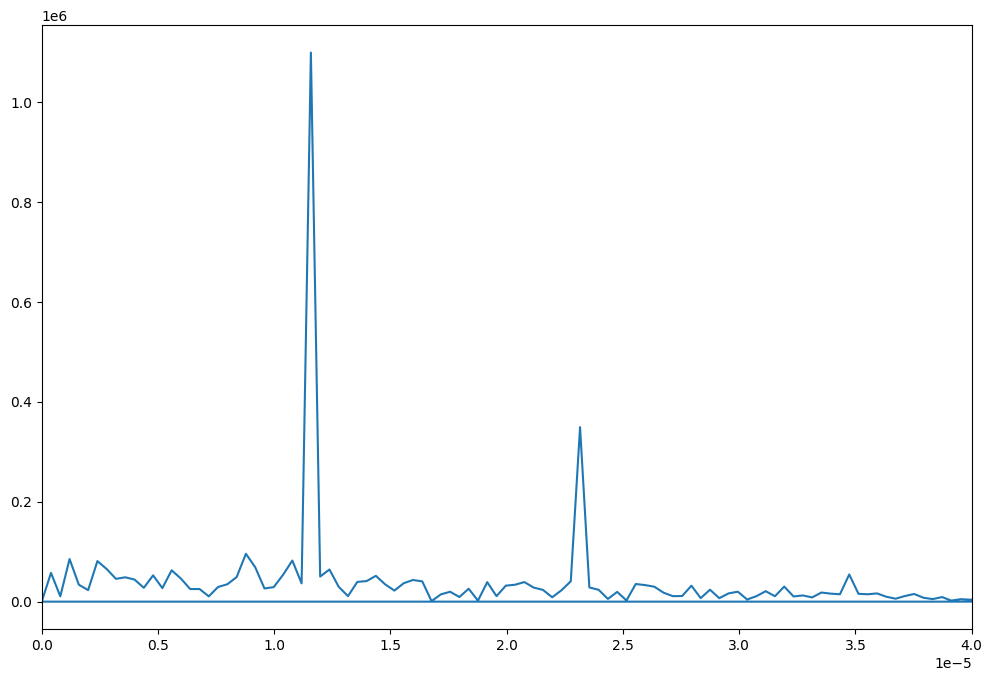

In [79]:
fig = plt.figure(figsize=(12,8),dpi=100)
#plt.plot(XFT,np.log(np.abs(FT)))
plt.plot(XFT,np.abs(FT))
#plt.ylim([0,1E3])
plt.xlim([0,4E-5])